# Blurring or Smoothing an Image

* Blurring or Smoothing is often combined with edge detection
* Edge detection algorithm detects too many edges when shown a high resolution image without any blurring

#### Methods used for blurring or smoothing 
* Gamma Correction : This can be applied to an image to make it appear brighter or darker depending on the value choosen for gamma
* Kernel Based Filters
    * This will help in creating many effects / filters :
    https://setosa.io/ev/image-kernels/

In [28]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [29]:
'''
by defalt the datatype will be uint8 or it can be anything else. Usually these values are float type
just making sure these values are read as float 
once it is converted to float type - the values in array... it is divided by 255 so that all he values
are with in 0 to 1 range
'''
def load_img():
    img = cv2.imread('Computer-Vision-with-Python/Computer-Vision-with-Python/DATA/bricks.jpg').astype(np.float32) / 255
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    return img

In [30]:
# load_img()

In [31]:
def display_img(img):
    fig = plt.figure(figsize=(15,15))
    ax = fig.add_subplot(111)
    ax.imshow(img)

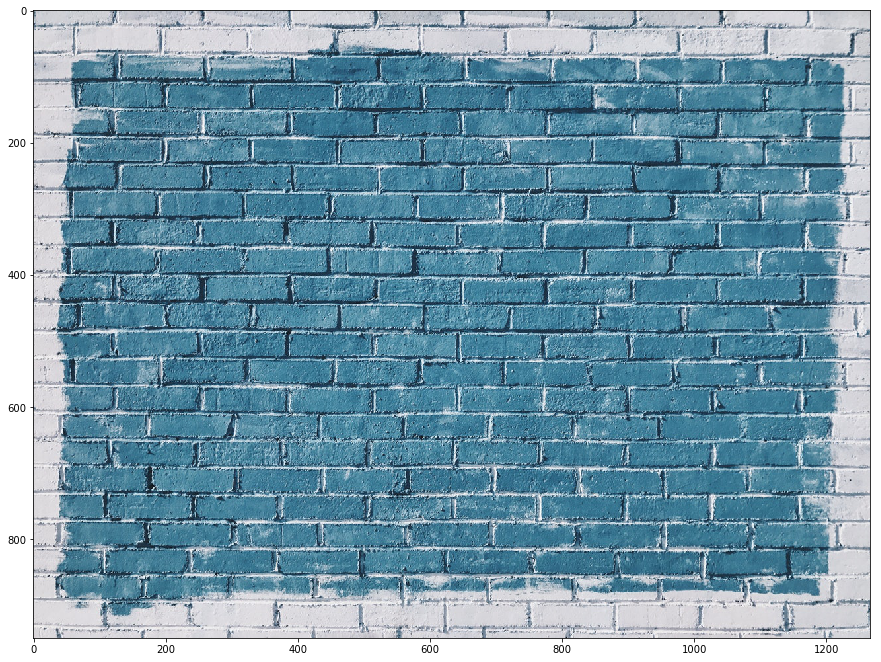

In [32]:
i = load_img()
display_img(i)

# Gamma Correction

In [33]:
# value < 1 - image will be brighter
gamma = 1/4 #2,8,1/2,1/8

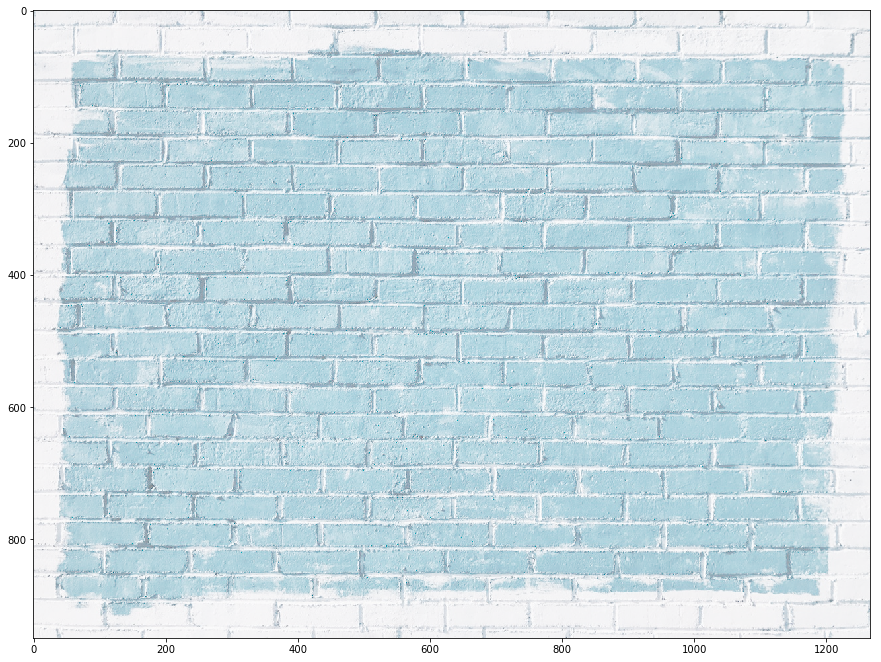

In [34]:
result = np.power(i,gamma)
display_img(result)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


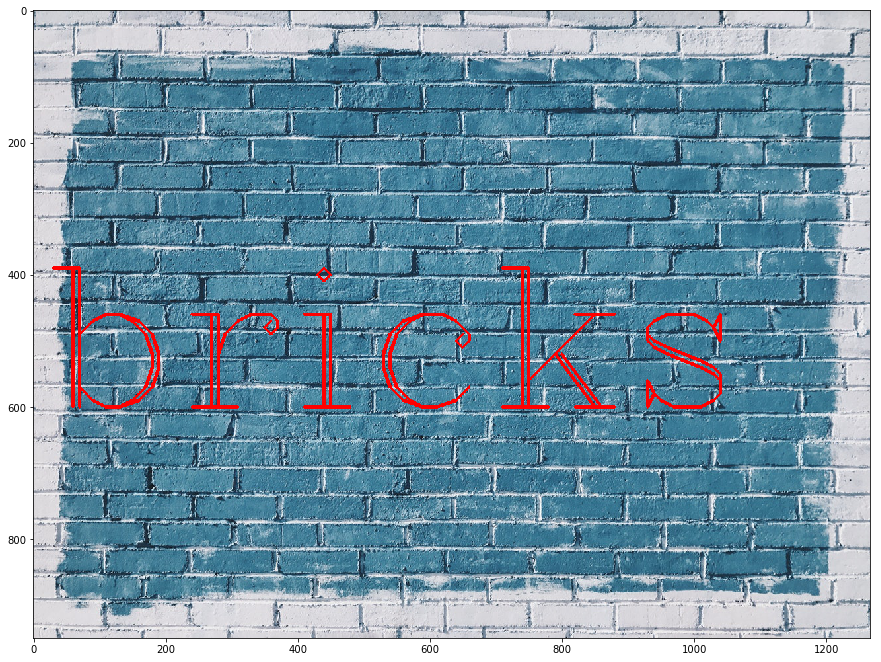

In [63]:
def reset_img():
    img = load_img()
    font = cv2.FONT_HERSHEY_COMPLEX
    cv2.putText(img,text='bricks',org=(10,600),fontFace=font,fontScale=10,color=(255,0,0),thickness=4)
    return img

img = reset_img()
display_img(img)

In [67]:
# you can try by applying different size of kernel and differnt values to see how it will smooth or sharpen the image
# try shape of (3,3) - divided by 50
# try shape of (5,5) - divided by 50
# try shape of (8,8) - divided by 25
# try shape of (8,8) - divided by 75 ... etc

# what you will see is that when the kernel size increases the blurrig will become more evident
# decrease kernel shape / size but increase each of weight, the image will become more sharp
kernel = np.ones(shape=(3,3),dtype=np.float32) /50

In [68]:
kernel

array([[0.02, 0.02, 0.02],
       [0.02, 0.02, 0.02],
       [0.02, 0.02, 0.02]], dtype=float32)

# now apply a 2-D filter on the kernel

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


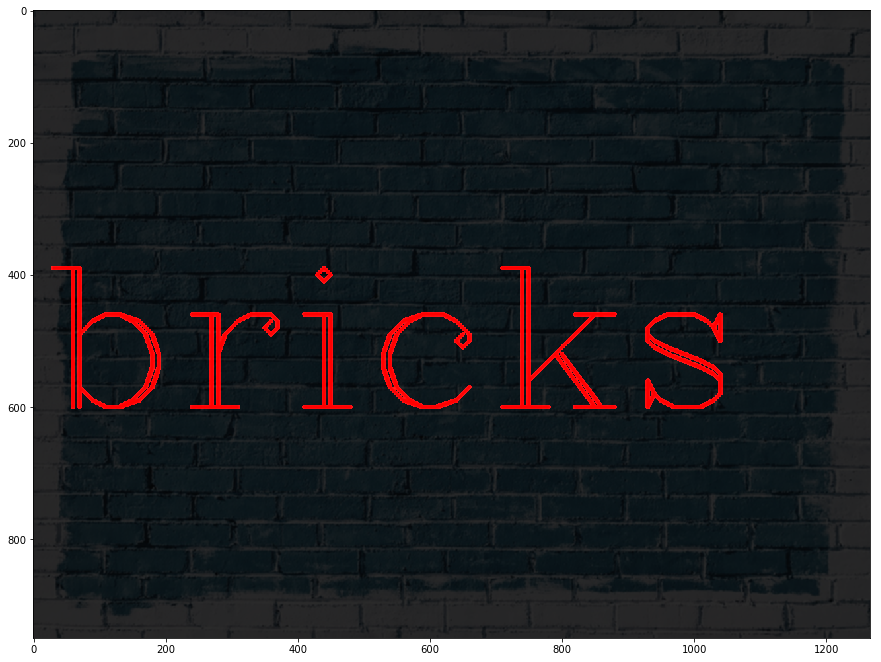

In [69]:
#ddepth = -1, this is set to this value because you want the output depth to be same as the input depth
# you can try with other values
img = reset_img()
dst = cv2.filter2D(img,-1,kernel)
display_img(dst)

In [70]:
img = reset_img()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


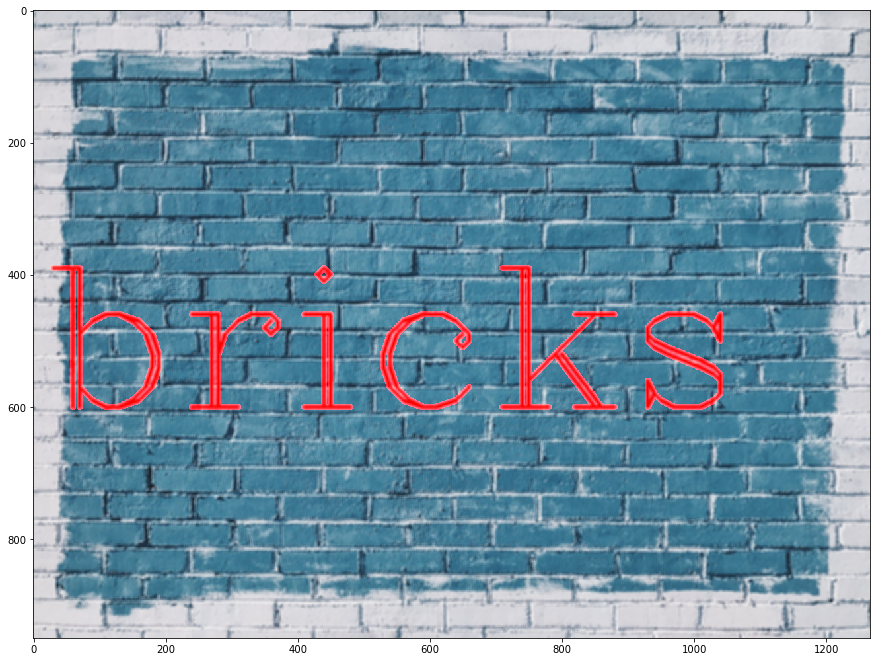

In [72]:
#inbuild blur kernel
blur = cv2.blur(img,ksize=(5,5))
display_img(blur)

In [73]:
img = reset_img()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


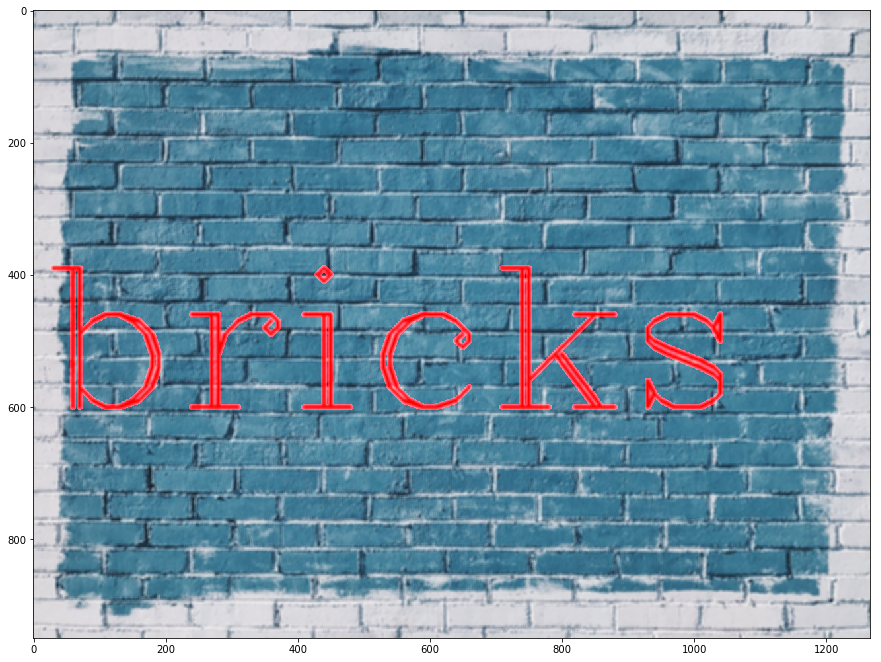

In [74]:
# Let us use a differnt sort of blurring
# sigmaX - standard deviation in x-direction
# if you just set sigmaX, then sigmaY will be fixed automatically
blurr = cv2.GaussianBlur(img,(5,5),10)
display_img(blurr)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


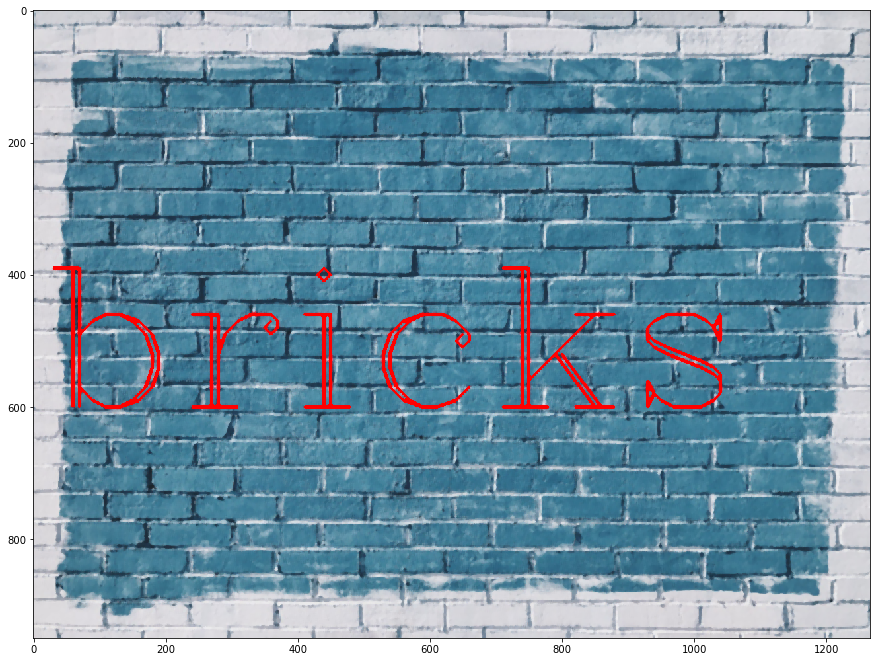

In [76]:
img = reset_img()
# Let us use a differnt sort of blurring - median blurring
# ksize - this is a square matrix so we can just input 1 value
blurr = cv2.medianBlur(img,5)
display_img(blurr)

#the above sort of blurring will help you remove the noise from the image and keep the detail of the actual text
#usually the noise is removed from the background , in this case the bricks and it will retain the actual text details.

#BroTip -  In photoshop when you try to remove noise from the photo, it is usually a median blur that is applied in the S/W

# Better example where an image has noise and how to remove it

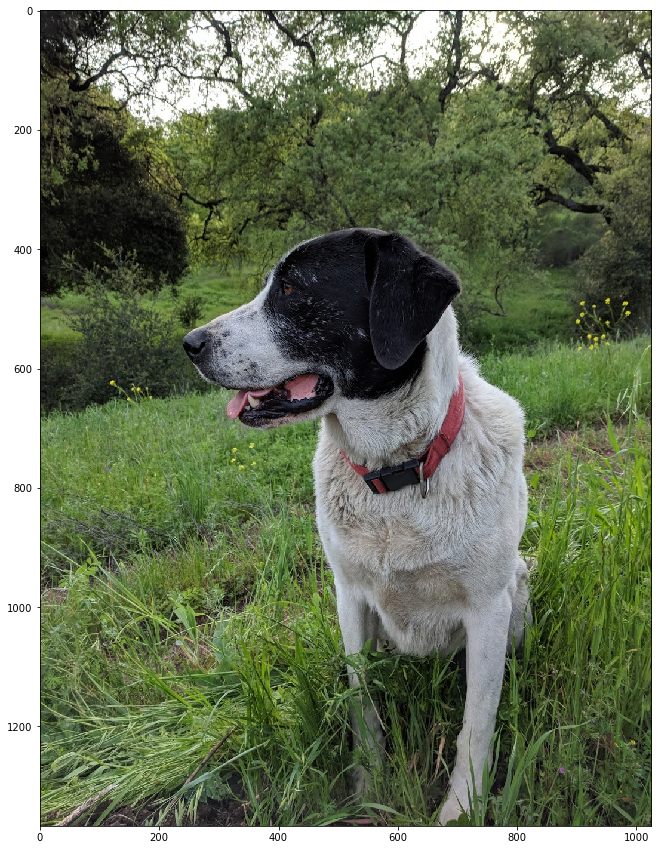

In [85]:
img = cv2.imread('Computer-Vision-with-Python/Computer-Vision-with-Python/DATA/sammy.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display_img(img)

# Now let us load the above image which contains noise

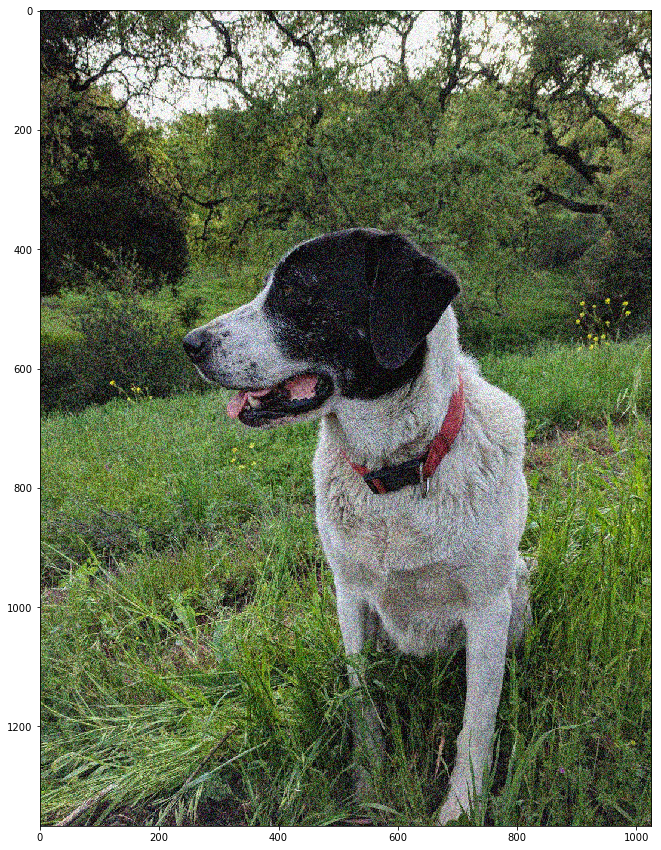

In [87]:
img = cv2.imread('Computer-Vision-with-Python/Computer-Vision-with-Python/DATA/sammy_noise.jpg')
#img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display_img(img)

# You can see that there is too much noise in the image

### Let us now use median blur and see if we can remove the noise

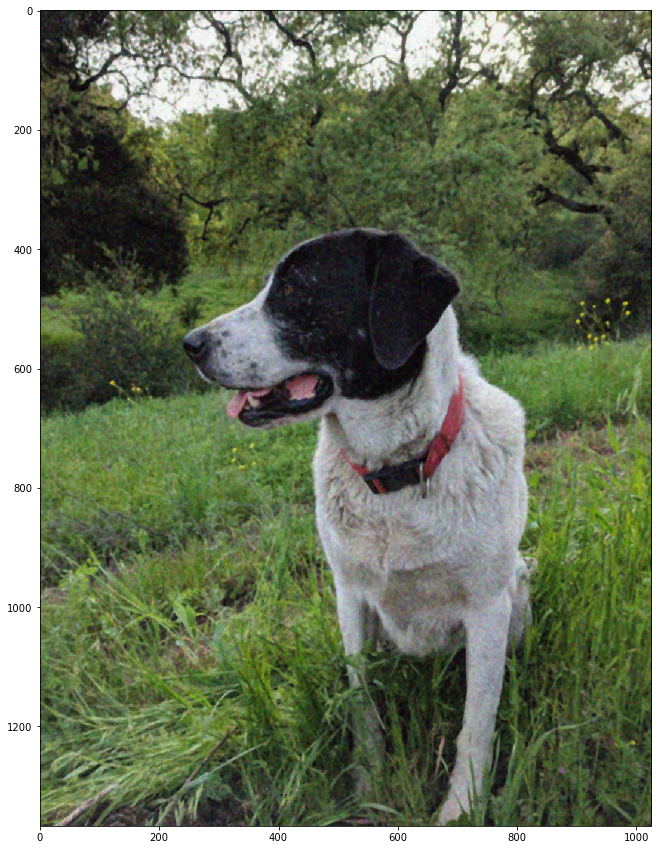

In [92]:
median = cv2.medianBlur(img,5)
display_img(median)

#### From the above image we can see that the noise level in the image has reduced, but does not match exactly to the orginal image
#### Some of the details are lost and few parts of the images are blurred

# Bi-Lateral filter

This reduces noise and keeps edges fairly sharp , this is usually slower compared to others

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


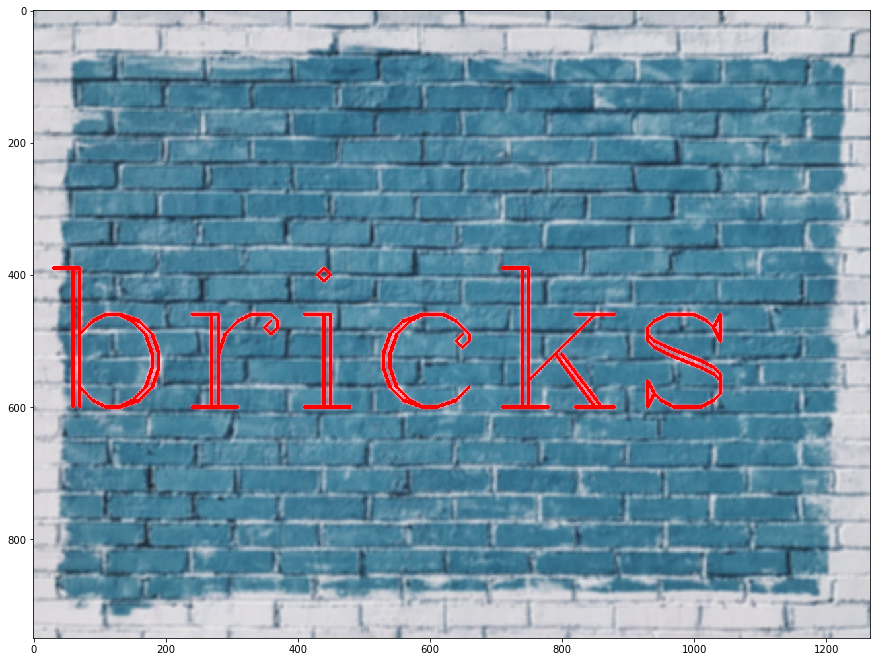

In [97]:
img = reset_img()
blurr = cv2.bilateralFilter(img,9,75,75)
display_img(blurr)

#### From above you can see that the image in the background is blurr , it is able to keep the text details pretty sharp around the lines and edges - kind of similar to median blur